# Analysing Topic Labels

In [3]:
import os
from os.path import join
import eland as ed
import pandas as pd
import numpy as np
import seaborn as sns; sns.set()
from wordcloud import WordCloud, STOPWORDS
from operator import itemgetter
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder
import nltk
import string
import plotly.express as px
import plotly.graph_objects as go
import preprocessor as prep
import matplotlib.pyplot as plt

project_dir = join(os.getcwd(), os.pardir)
models_dir = join(project_dir, 'models')
zstc_dir = join(project_dir, 'reports', 'figures', 'zstc-wordclouds')

pd.set_option('display.max_colwidth', -1)

%config InlineBackend.figure_format = 'svg'

In [4]:
TERMS = ['sympathy', 'complaint', 'hope', 'job', 'relief measures', 'compensation',
        'evacuation', 'income', 'ecosystem', 'government', 'corruption', 'news updates', 
        'volunteers', 'donation', 'mobile network', 'housing', 'farm', 'utilities', 
        'water supply', 'power supply', 'food supply', 'medical assistance', 'coronavirus', 
        'petition', 'poverty']

THRESHOLD = 0.7

## Import Tweets from ES

In [5]:
ed_df = ed.DataFrame('localhost', 'twitter', columns=['full_text_processed', 'sentiment', 'retweet_count'])

# defining the full-text query we need: Retrieving records for full_text_processed with the condition is_retweet=False and is_quote_status=False

query_unique = {
    "bool": {
        "must": {
            "term":{"is_retweet":"false"},
        },
        "filter": {
            "term":{"is_quote_status":"false"}
        },
    }
}
# using full-text search capabilities with Eland:
df_ed = ed_df.es_query(query_unique)
df_tweets = df_ed.to_pandas()

## Basic Tweet Preprocessing
- Remove URLs and reserved words (RTs)
- Remove # and @ symbols


In [6]:
## Set options for the tweet-preprocessor
prep.set_options(prep.OPT.URL, prep.OPT.RESERVED, prep.OPT.EMOJI, prep.OPT.SMILEY)

## Clean text and remove #,@ symbols
def clean_tweet(text):
    text = prep.clean(text)
    table = str.maketrans('','',string.punctuation)
    return text.translate(table)

In [7]:
#df_tweets['full_text'] = df_tweets['full_text'].apply(lambda x: clean_tweet(x))

In [8]:
df_tweets.head()

,full_text_processed,sentiment,retweet_count
1262961673708675072,live cyclone amphan map tracking storm’s path,0.0000,0
1262961660932894720,nyt live cyclone amphan map tracking storm’s path,0.0000,0
1262961652359729152,live news update super cyclone amphan amphanupdate cycloneamphan amphancyclone cycloneamphanupdate 120 km nearly south paradip odisha 200 km southsouthwest digha west bengal 360 km southsouthwest khepupara bangladesh,0.5994,0
1262960808742522880,cyclone ampan came closer live super cyclone amphan update pradip odisha 120 km orissa digha west bengal 200 km west bengal khepupara bangladesh 360 km bangladesh bangladesh bangla west bengal cyclone amphan,0.5994,0
1262937945214005248,live news update super cyclone amphan amphanupdate cycloneamphan amphancyclone cycloneamphanupdate 125 km nearly south paradip odisha 225 km southsouthwest digha west bengal 380 km southsouthwest khepupara bangladesh,0.5994,0


## Loading the tweet labels

In [9]:
df_labels = pd.read_json(join(models_dir,'zstc_labels.json'), orient='index', convert_axes=False)

In [10]:
df_labels.head(3)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
1264253979002843136,"[relief measures, 0.67]","[complaint, 0.63]","[poverty, 0.48]","[evacuation, 0.46]","[sympathy, 0.44]","[medical assistance, 0.32]","[income, 0.30000000000000004]","[housing, 0.29]","[petition, 0.23]","[corruption, 0.22]",...,"[food supply, 0.07]","[hope, 0.07]","[utilities, 0.05]","[news updates, 0.05]","[coronavirus, 0.04]","[farm, 0.03]","[donation, 0.03]","[volunteers, 0.02]","[government, 0.02]","[job, 0.01]"
1264253959918632960,"[relief measures, 0.5]","[job, 0.06]","[farm, 0.04]","[volunteers, 0.01]","[evacuation, 0.01]","[petition, 0.0]","[complaint, 0.0]","[sympathy, 0.0]","[compensation, 0.0]","[income, 0.0]",...,"[medical assistance, 0.0]","[mobile network, 0.0]","[power supply, 0.0]","[government, 0.0]","[poverty, 0.0]","[housing, 0.0]","[corruption, 0.0]","[food supply, 0.0]","[hope, 0.0]","[water supply, 0.0]"
1264253893632016384,"[government, 0.98]","[hope, 0.97]","[power supply, 0.93]","[sympathy, 0.86]","[ecosystem, 0.77]","[medical assistance, 0.72]","[complaint, 0.6900000000000001]","[relief measures, 0.67]","[petition, 0.5700000000000001]","[income, 0.44]",...,"[evacuation, 0.24]","[housing, 0.21]","[poverty, 0.2]","[job, 0.18]","[farm, 0.16]","[food supply, 0.16]","[coronavirus, 0.12]","[donation, 0.1]","[corruption, 0.08]","[volunteers, 0.0]"


In [11]:
'''Method to return topics for every tweet with confidence score above threshold'''
def get_labels(tweet, threshold=THRESHOLD):
    topics = []
    for topic in tweet:
        topic_name, value = topic[0], topic[1]
        if value>threshold:
            topics.append((topic_name, np.round(value,2)))
    if not topics:
        topics.append((tweet[0][0], tweet[0][1]))
    return topics  

In [12]:
df_labels['labels'] = df_labels.apply(lambda x: get_labels(x, THRESHOLD), axis=1)
df_labels = df_labels[['labels']]

In [13]:
df_labels.head()

,labels
1264253979002843136,"[(relief measures, 0.67)]"
1264253959918632960,"[(relief measures, 0.5)]"
1264253893632016384,"[(government, 0.98), (hope, 0.97), (power supply, 0.93), (sympathy, 0.86), (ecosystem, 0.77), (medical assistance, 0.72)]"
1264253882580045824,"[(income, 0.75)]"
1264253658763612160,"[(complaint, 0.94), (relief measures, 0.93), (petition, 0.88), (donation, 0.87), (sympathy, 0.86)]"


## Merging the Tweets with Labels

In [14]:
df_tweet_labels = pd.merge(df_tweets, df_labels, left_index=True, right_index=True)
df_tweet_labels.head(3)

,full_text_processed,sentiment,retweet_count,labels
1262961673708675072,live cyclone amphan map tracking storm’s path,0.0000,0,"[(sympathy, 0.11)]"
1262961660932894720,nyt live cyclone amphan map tracking storm’s path,0.0000,0,"[(utilities, 0.25)]"
1262961652359729152,live news update super cyclone amphan amphanupdate cycloneamphan amphancyclone cycloneamphanupdate 120 km nearly south paradip odisha 200 km southsouthwest digha west bengal 360 km southsouthwest khepupara bangladesh,0.5994,0,"[(news updates, 1.0)]"


## WordClouds for each Topic Label

In [21]:
'''Method to extract the tweet text for given topic'''
def get_label_agg(term):
    text = []
    sentiments = []
    retweet_count = 0
    for idx, row in df_tweet_labels.iterrows():
        try:
            tweet = [row['full_text_processed'] for item in row['labels'] if item[0]==term]
            if tweet:
                text.append(tweet[0])
                sentiments.append(row['sentiment'])
                retweet_count += row['retweet_count']
        except:
            pass
    return text, sentiments, retweet_count

In [22]:
'''Print WordCloud for unigrams for specified topic'''
def get_wordcloud_unigrams(text):
    wordcloud_unigrams = WordCloud(width = 800, height = 800, include_numbers=True,
                background_color ='black', max_words=200, collocations=False, max_font_size=120,
                min_font_size = 8, stopwords = set(STOPWORDS)).generate(text.lower())
    
    return wordcloud_unigrams

'''Print WordCloud for bigrams for specified topic'''
def get_wordcloud_bigrams(text):
    tokens = nltk.word_tokenize(text.lower())
    tokens = [word for word in tokens if word not in STOPWORDS]
    finder = BigramCollocationFinder.from_words(tokens)
    bigram_measures = BigramAssocMeasures()
    scored = finder.score_ngrams(bigram_measures.raw_freq)

    scoredList = sorted(scored, key=itemgetter(1), reverse=True)

    word_dict = {}
    listLen = len(scoredList)
    
    # Get the bigram and make a contiguous string for the dictionary key. 
    # Set the key to the scored value. 
    for i in range(listLen):
        word_dict['_'.join(scoredList[i][0])] = scoredList[i][1]

    wordcloud_bigrams = WordCloud(width = 800, height = 800, 
                background_color ='black', max_words=100,
                min_font_size = 10).generate_from_frequencies(word_dict)
    return wordcloud_bigrams

'''Print and Save Wordclouds'''
def print_wordclouds(wordcloud_unigrams, wordcloud_bigrams, topic):

    # Create images directory if it doesn't exist
    if os.path.isdir(zstc_dir) == False:
        os.system('mkdir '+zstc_dir)

    fig = plt.figure(figsize = (10, 10), facecolor = None)
    
    # plot the WordCloud Unigram image
    fig.add_subplot(1, 2, 1)
    plt.title('Wordcloud over Unigrams')
    plt.imshow(wordcloud_unigrams, interpolation='bilinear') 
    plt.axis("off")
    plt.tight_layout(pad = 2) 
    
    # plot the WordCloud image
    fig.add_subplot(1, 2, 2)                        
    plt.imshow(wordcloud_bigrams, interpolation='bilinear') 
    plt.axis("off") 
    plt.title('Wordcloud over Bigrams')
    plt.tight_layout(pad = 2)
    plt.savefig(zstc_dir+'/{}.png'.format(topic), dpi=300) # Save figure

    plt.show() 


Wordcloud for Label - sympathy


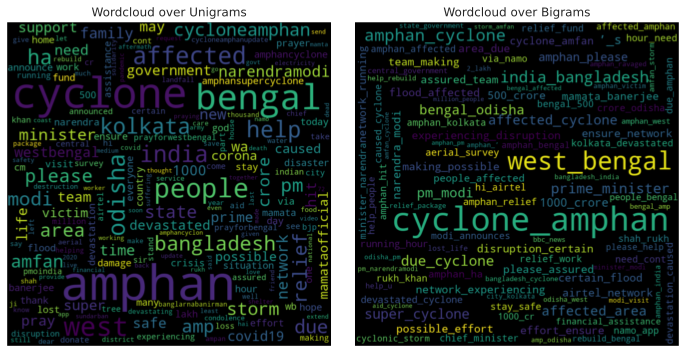


Wordcloud for Label - complaint


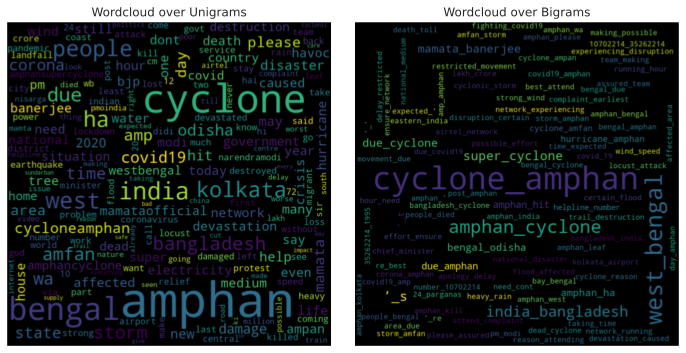


Wordcloud for Label - hope


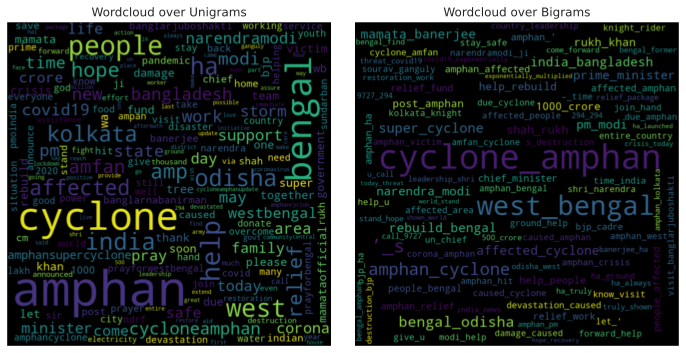


Wordcloud for Label - job


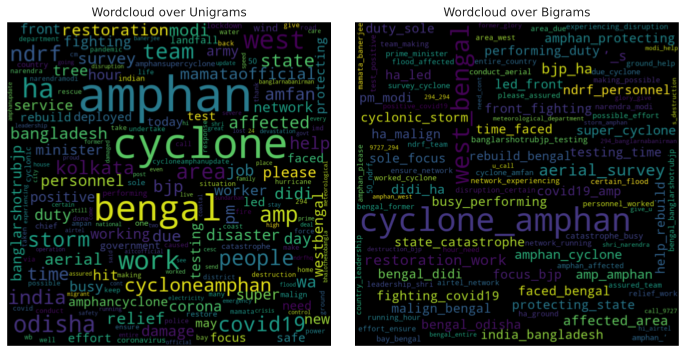


Wordcloud for Label - relief measures


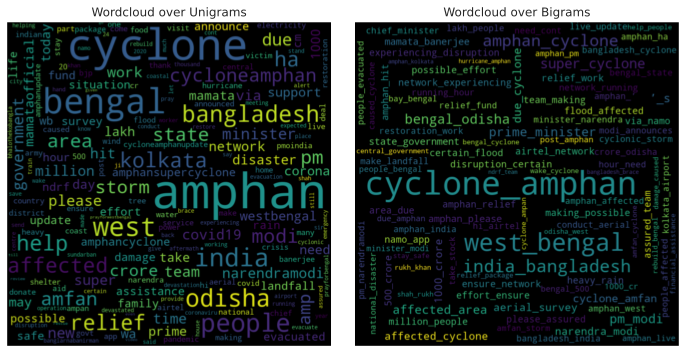


Wordcloud for Label - compensation


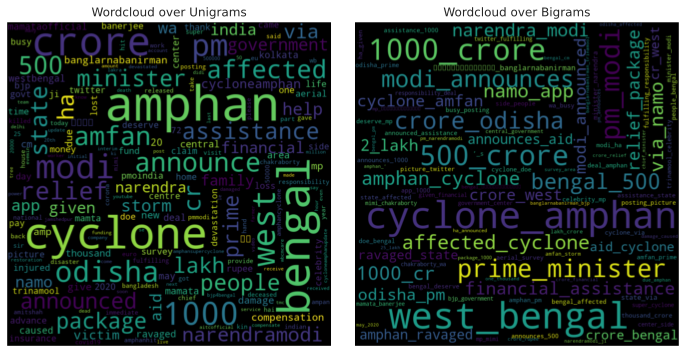


Wordcloud for Label - evacuation


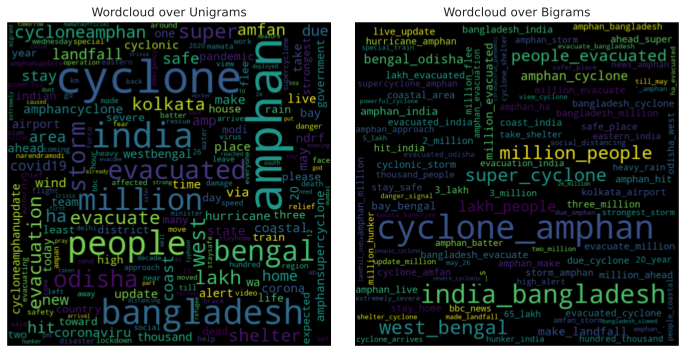


Wordcloud for Label - income


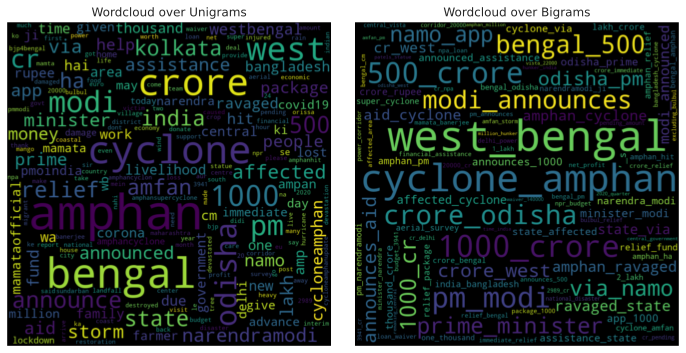


Wordcloud for Label - ecosystem


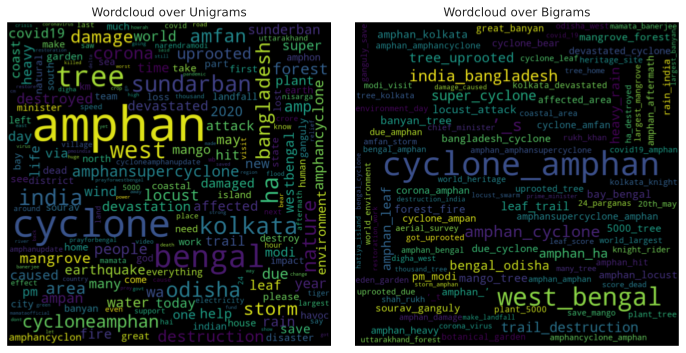


Wordcloud for Label - government


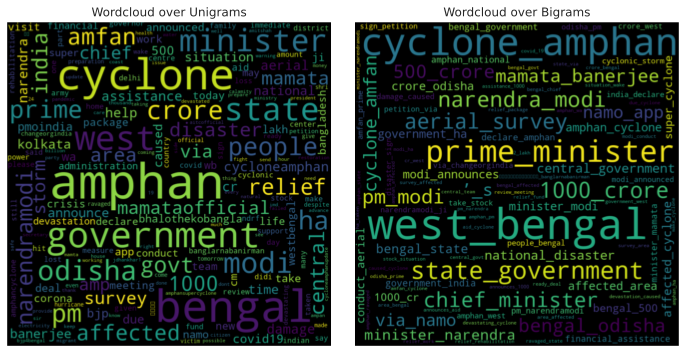


Wordcloud for Label - corruption


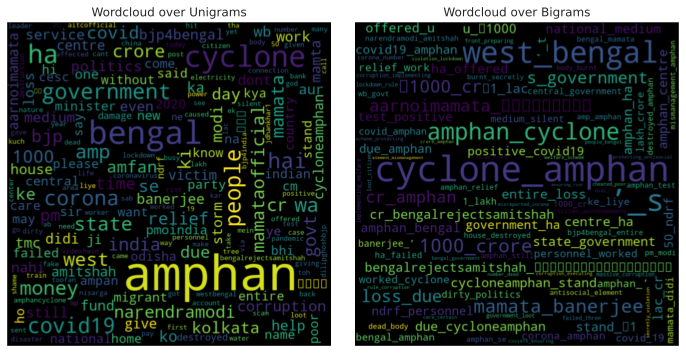


Wordcloud for Label - news updates


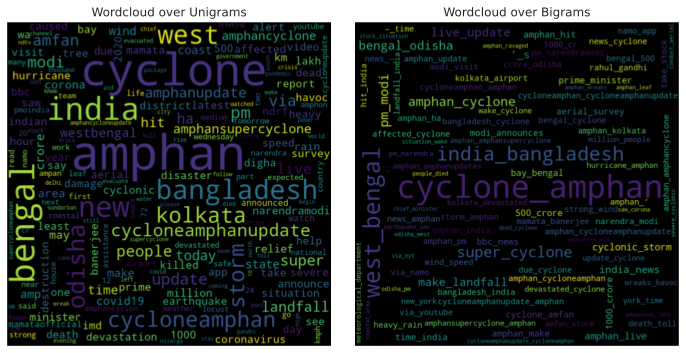


Wordcloud for Label - volunteers


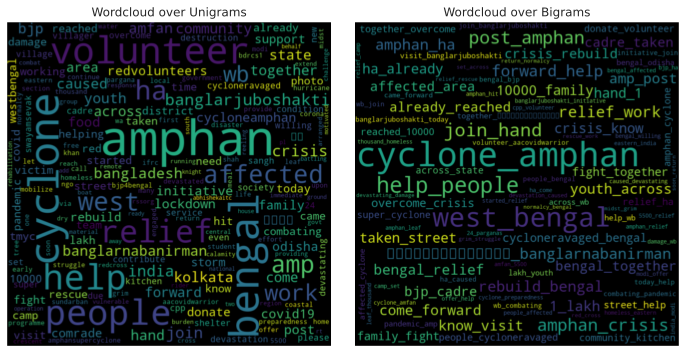


Wordcloud for Label - donation


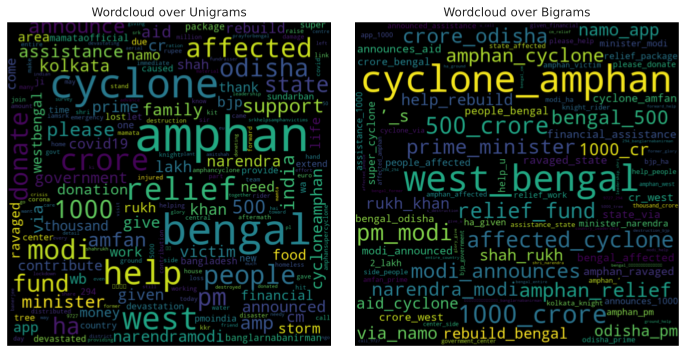


Wordcloud for Label - mobile network


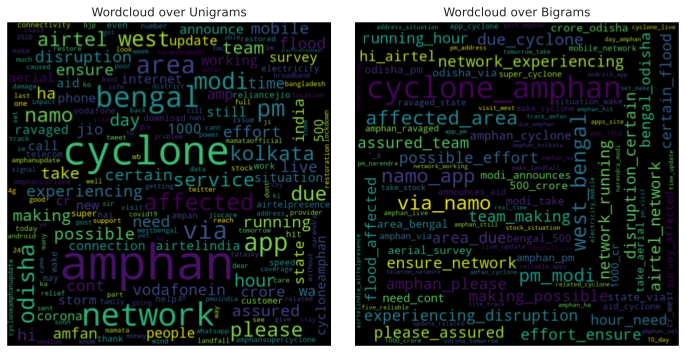


Wordcloud for Label - housing


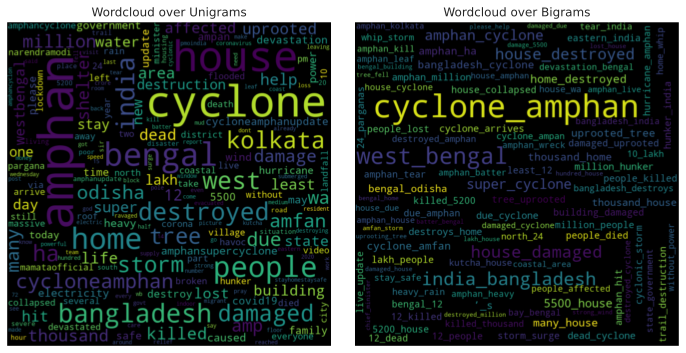


Wordcloud for Label - farm


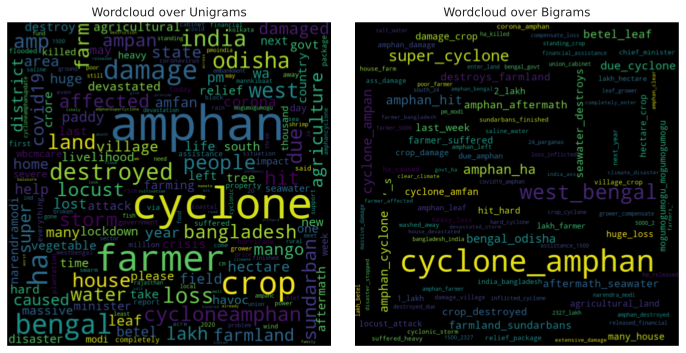


Wordcloud for Label - utilities


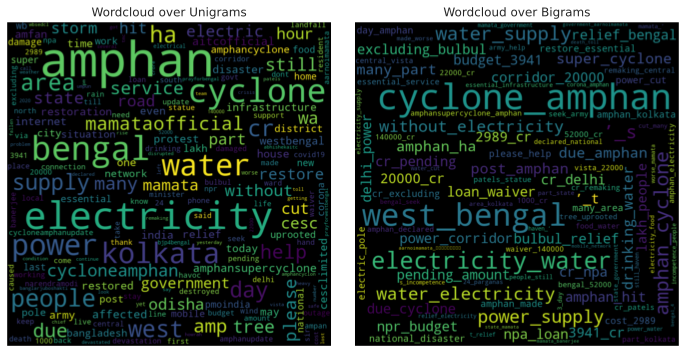


Wordcloud for Label - water supply


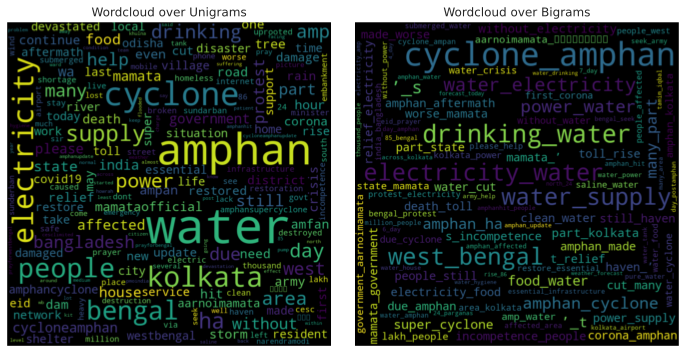


Wordcloud for Label - power supply


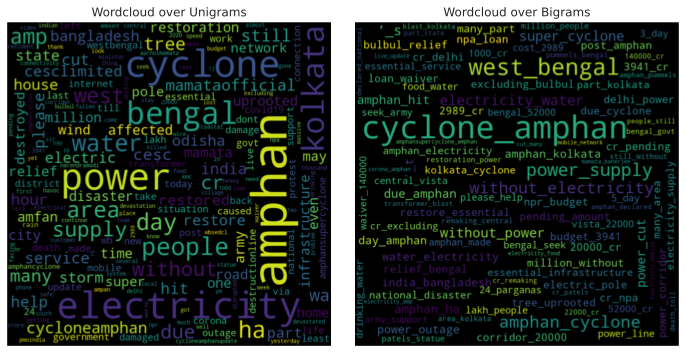


Wordcloud for Label - food supply


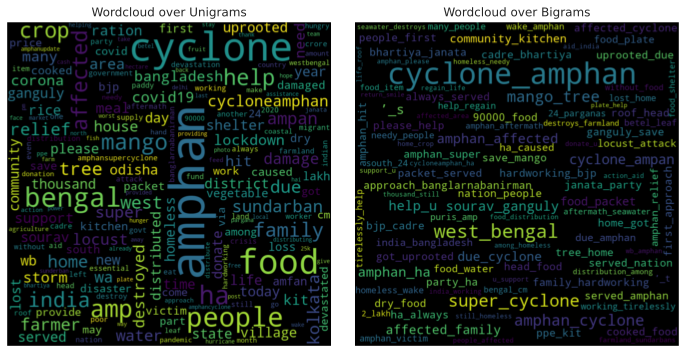


Wordcloud for Label - medical assistance


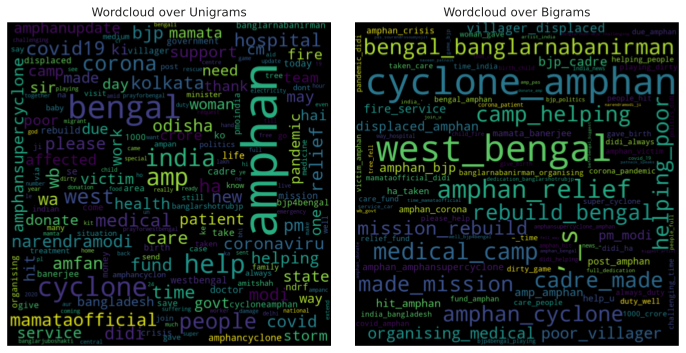


Wordcloud for Label - coronavirus


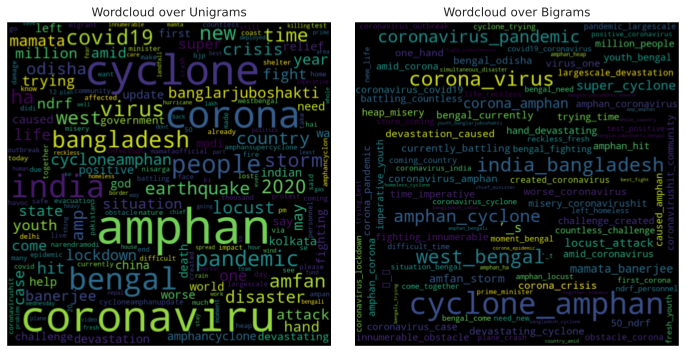


Wordcloud for Label - petition


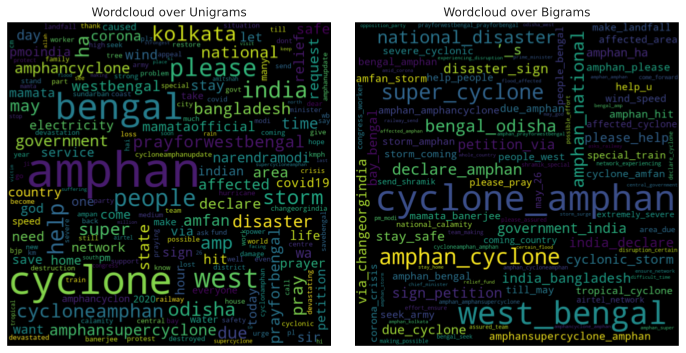


Wordcloud for Label - poverty


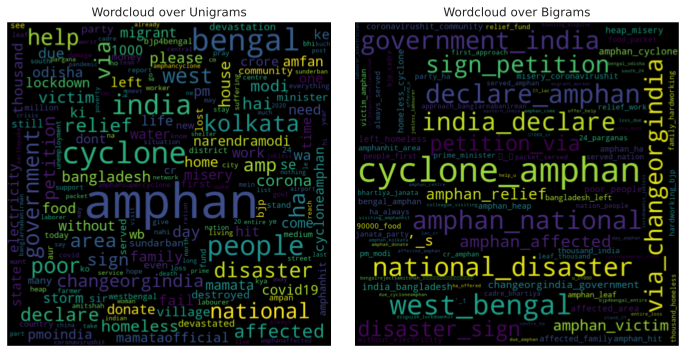

In [23]:
label_data = {}
for label in TERMS:
    label_data[label] = {}
    text, sentiments, rc = get_label_agg(label)
    label_data[label]['sentiments'] = sentiments
    label_data[label]['retweet_count'] = rc
    text = ' '.join(text)
    wordcloud_unigrams = get_wordcloud_unigrams(text)
    wordcloud_bigrams = get_wordcloud_bigrams(text)
    print('\nWordcloud for Label -',label)
    print_wordclouds(wordcloud_unigrams, wordcloud_bigrams, label)


## Sentiment Boxplot for Labels

In [24]:
fig = go.Figure()

for label in label_data.keys():
    fig.add_trace(go.Box(y=label_data[label]['sentiments'], name=label))

fig.update_layout(
    title='Sentiment Values of Labels',
    autosize=False,
    width=1200,
    height=400,
    margin=dict(l=20, r=20, t=40, b=20),
    showlegend=False
)

fig.show()

## Number of Tweets per Label

In [25]:
fig = go.Figure()

fig.add_trace(go.Bar(y=[len(label_data[label]['sentiments']) for label in label_data], x=[label for label in label_data]))

fig.update_layout(
    title='Number of Tweets per Label',
    autosize=False,
    width=1200,
    height=400,
    margin=dict(l=20, r=20, t=40, b=20),
    showlegend=False
)

fig.show()

## Retweet Count per Label

In [26]:
fig = go.Figure()

fig.add_trace(go.Bar(y=[label_data[label]['retweet_count'] for label in label_data], x=[label for label in label_data]))

fig.update_layout(
    title='Total Retweet Count per Label',
    autosize=False,
    width=1200,
    height=400,
    margin=dict(l=20, r=20, t=40, b=20),
    showlegend=False
)

fig.show()